# Challenge: Predict Waste Production for its Reduction

#### According to the World Bank, in 2016 cities generated 2.01 billion tons of solid waste. Per person, this is around 0.74 kg/day! With the rapid growth of cities, this number is only expected to increase. As cities are growing, it is urgent that optimization processes for waste processing and more targeted public education on waste management and separation. Finally, it is also important to note that waste collection also has an impact on air pollution.

#### The goal of this challenge is to help identify trends in waste production and help to create insights into how to reduce waste and optimize its collection.

## Exploratory Data Analysis

##### The primary dataset used here is the Daily Waste Collection Report for Austin, Texas.

In [1]:
# Libraries for data analytics
import numpy as np
import pandas as pd

# Libraries for plotting
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%matplotlib inline

# Set seaborn theme
sns.set_theme(style="white")

In [2]:
## Assign data file to variable and read it into a dataframe
datafile = './data/Waste_Collection___Diversion_Report__daily_.csv'
df = pd.read_csv(datafile)

In [3]:
df.head()

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID
0,12/08/2020,BULK,12/08/2020 03:02:00 PM,5220.0,TDS LANDFILL,BULK,BU13,899097
1,12/08/2020,RECYCLING - SINGLE STREAM,12/08/2020 10:00:00 AM,11140.0,TDS - MRF,RECYCLING - SINGLE STREAM,RTAU53,899078
2,12/03/2020,RECYCLING - SINGLE STREAM,12/03/2020 10:34:00 AM,10060.0,BALCONES RECYCLING,RECYCLING - SINGLE STREAM,RHBU10,899082
3,12/07/2020,SWEEPING,12/07/2020 10:15:00 AM,7100.0,TDS LANDFILL,SWEEPER DUMPSITES,DSS04,899030
4,12/07/2020,RECYCLING - SINGLE STREAM,12/07/2020 04:00:00 PM,12000.0,TDS - MRF,RECYCLING - SINGLE STREAM,RMAU53,899048


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 740873 entries, 0 to 740872
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Report Date   740873 non-null  object 
 1   Load Type     740873 non-null  object 
 2   Load Time     740873 non-null  object 
 3   Load Weight   668538 non-null  float64
 4   Dropoff Site  740873 non-null  object 
 5   Route Type    740873 non-null  object 
 6   Route Number  740873 non-null  object 
 7   Load ID       740873 non-null  int64  
dtypes: float64(1), int64(1), object(6)
memory usage: 45.2+ MB


##### We see that there are missing values present for Load Weight which will have to be dealt with later on.

In [5]:
df.describe()

,Load Weight,Load ID
count,6.685380e+05,740873.000000
mean,1.176348e+04,521353.123651
std,7.554856e+03,249972.621259
min,-4.480000e+03,101223.000000
25%,5.740000e+03,289609.000000
50%,1.102000e+04,554862.000000
75%,1.652000e+04,741648.000000
max,1.562821e+06,929006.000000


In [6]:
# Add time features into the dataframe

df['Date'] = pd.to_datetime(df['Report Date'], infer_datetime_format=True)
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day of Week'] = df['Date'].dt.dayofweek 
df['Hour'] = pd.DatetimeIndex(df['Load Time']).hour

In [7]:
df.head()

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Date,Year,Month,Day of Week,Hour
0,12/08/2020,BULK,12/08/2020 03:02:00 PM,5220.0,TDS LANDFILL,BULK,BU13,899097,2020-12-08,2020,12,1,15
1,12/08/2020,RECYCLING - SINGLE STREAM,12/08/2020 10:00:00 AM,11140.0,TDS - MRF,RECYCLING - SINGLE STREAM,RTAU53,899078,2020-12-08,2020,12,1,10
2,12/03/2020,RECYCLING - SINGLE STREAM,12/03/2020 10:34:00 AM,10060.0,BALCONES RECYCLING,RECYCLING - SINGLE STREAM,RHBU10,899082,2020-12-03,2020,12,3,10
3,12/07/2020,SWEEPING,12/07/2020 10:15:00 AM,7100.0,TDS LANDFILL,SWEEPER DUMPSITES,DSS04,899030,2020-12-07,2020,12,0,10
4,12/07/2020,RECYCLING - SINGLE STREAM,12/07/2020 04:00:00 PM,12000.0,TDS - MRF,RECYCLING - SINGLE STREAM,RMAU53,899048,2020-12-07,2020,12,0,16


In [8]:
df.groupby(['Year']).count()

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Date,Month,Day of Week,Hour
Year,,,,,,,,,,,,
2003,1,1,1,1,1,1,1,1,1,1,1,1
2004,10957,10957,10957,9756,10957,10957,10957,10957,10957,10957,10957,10957
2005,45822,45822,45822,40847,45822,45822,45822,45822,45822,45822,45822,45822
2006,48487,48487,48487,43321,48487,48487,48487,48487,48487,48487,48487,48487
2007,49515,49515,49515,44352,49515,49515,49515,49515,49515,49515,49515,49515
2008,50705,50705,50705,45527,50705,50705,50705,50705,50705,50705,50705,50705
2009,42194,42194,42194,37602,42194,42194,42194,42194,42194,42194,42194,42194
2010,41276,41276,41276,36611,41276,41276,41276,41276,41276,41276,41276,41276
2011,40853,40853,40853,36275,40853,40853,40853,40853,40853,40853,40853,40853


#### Data Preprocessing
<ol>
    <li> Drop Year 2003 as there is only one datapoint for the entire year </li>
    <li> Drop rows with NA for Load Weight </li>
</ol>

In [9]:
df.drop(df.loc[df["Year"] == 2003].index, inplace=True);
df.dropna(inplace=True);

In [10]:
df.head()

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Date,Year,Month,Day of Week,Hour
0,12/08/2020,BULK,12/08/2020 03:02:00 PM,5220.0,TDS LANDFILL,BULK,BU13,899097,2020-12-08,2020,12,1,15
1,12/08/2020,RECYCLING - SINGLE STREAM,12/08/2020 10:00:00 AM,11140.0,TDS - MRF,RECYCLING - SINGLE STREAM,RTAU53,899078,2020-12-08,2020,12,1,10
2,12/03/2020,RECYCLING - SINGLE STREAM,12/03/2020 10:34:00 AM,10060.0,BALCONES RECYCLING,RECYCLING - SINGLE STREAM,RHBU10,899082,2020-12-03,2020,12,3,10
3,12/07/2020,SWEEPING,12/07/2020 10:15:00 AM,7100.0,TDS LANDFILL,SWEEPER DUMPSITES,DSS04,899030,2020-12-07,2020,12,0,10
4,12/07/2020,RECYCLING - SINGLE STREAM,12/07/2020 04:00:00 PM,12000.0,TDS - MRF,RECYCLING - SINGLE STREAM,RMAU53,899048,2020-12-07,2020,12,0,16


In [11]:
df_sum_load_type = df.groupby('Load Type').agg('sum')

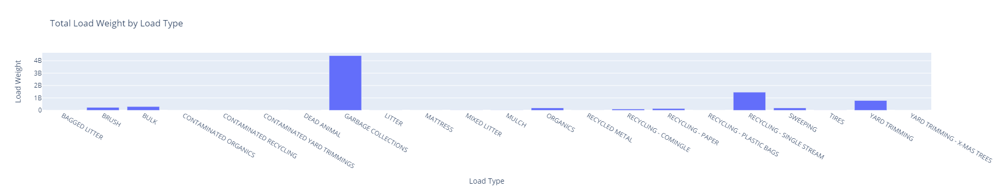

In [12]:
px.bar(df_sum_load_type, x=df_sum_load_type.index, y='Load Weight', title='Total Load Weight by Load Type')

The major categories in order of Load Weight are:
1. Garbage Collections
2. Recycling - Single Stream
3. Yard Trimming

It is interesting that the other categories are small compared to the three. This may be the case due to:
(i) Low demand
(ii) Shorter existence of category in the data, or other factors.

#### Check if data is available in all unique years 
##### We first check if for any given category of waste, data is present in all the years represented in the full dataset. To be specific, we are not checking if there is data within each year that has no missing months, days etc. We are only checking for the presence of *any* data in a year, as a high level check of the prevalence of each trash category.

In [13]:
df_subset = df[['Load Type', 'Load Weight', 'Year', 'Date', 'Month']]

In [14]:
years_data = {}
for load_type in df_subset['Load Type'].unique():
    temp_df = df_subset[df_subset['Load Type']==load_type]
    years = list(temp_df['Year'].unique())
    count = len(years)
    years_data[load_type] = (years, count)

In [15]:
years_data

{'BULK': ([2020,
   2010,
   2015,
   2007,
   2017,
   2014,
   2016,
   2005,
   2012,
   2011,
   2019,
   2006,
   2018,
   2013,
   2008,
   2009,
   2004,
   2021],
  18),
 'RECYCLING - SINGLE STREAM': ([2020,
   2012,
   2018,
   2019,
   2008,
   2015,
   2016,
   2014,
   2009,
   2013,
   2010,
   2011,
   2017,
   2006,
   2007,
   2005,
   2004,
   2021],
  18),
 'SWEEPING': ([2020,
   2009,
   2004,
   2005,
   2014,
   2011,
   2013,
   2008,
   2006,
   2010,
   2012,
   2017,
   2016,
   2015,
   2018,
   2019,
   2007,
   2021],
  18),
 'GARBAGE COLLECTIONS': ([2020,
   2010,
   2017,
   2008,
   2011,
   2015,
   2013,
   2004,
   2009,
   2005,
   2014,
   2016,
   2006,
   2007,
   2018,
   2012,
   2019,
   2021],
  18),
 'YARD TRIMMING': ([2020,
   2014,
   2016,
   2018,
   2017,
   2006,
   2007,
   2019,
   2015,
   2008,
   2010,
   2013,
   2005,
   2011,
   2009,
   2012,
   2004,
   2021],
  18),
 'BRUSH': ([2020,
   2008,
   2014,
   2019,
   2006,
   2005

Based on the dictionary above, Organics, Recycling - Comingle, Recycling - Paper, Bagged Litter, Mulch, Mattress, Recycling Plastic Bags, Contaminated Recycling, Contaminated Yard Trimmings, Yard Trimming - X-Mas Trees have no data for several years. (Recycled Metal has no data for 1 year in 2013, but is otherwise fairly complete.)

Unsurprisingly, these categories are also relatively small in the contribution to total waste over the 2005-2020 period. However, it is not the case that categories with data present in all years form a significant proportion of all thrash in the data. Even though the categories Dead Animal, Litter, Mixed Litter, Recycled Metal, Sweeping, Tires have data for all/nearly all years, their contribution to the total trash load is relatively small.

We next check which categories have **non-missing data** in terms of **both months and years**. Since all years before 2005 and 2021 have incomplete monthly data, these years are dropped from this analysis:

In [16]:
df_month_year = df.groupby(['Load Type','Year', 'Month']).agg('sum')
df_month_year

Load Weight  Load ID  Day of Week  \
Load Type                   Year Month                                      
BAGGED LITTER               2004 12          2140.0   329751            6   
                            2005 1           4840.0   342192            8   
                                 3           6460.0   123289            3   
                                 9            660.0   146971            2   
                                 10          3060.0   595632           11   
...                                             ...      ...          ...   
YARD TRIMMING - X-MAS TREES 2017 4           6620.0   737358            2   
                                 5           5200.0   738363            2   
                            2018 2          12860.0   771932            3   
                                 5          21120.0   781180            2   
                                 11          7660.0   803211            0   

                                        Hour  
Load Type                   Year Month        
BAGGED LITTER               2004 12       29  
                            2005 1        37  
                                 3        12  
                                 9         3  
                                 10       34  
...                                      ...  
YARD TRIMMING - X-MAS TREES 2017 4        17  
                                 5        15  
                            2018 2        13  
                                 5        13  
                                 11       12  

[2308 rows x 4 columns]

In [17]:
df_month_year = df_month_year.reset_index()

In [18]:
df_month_year = df_month_year[(df_month_year['Year']>2004)&(df_month_year['Year']<2021)]
df_month_year = df_month_year.drop(columns=['Load ID', 'Hour', 'Day of Week'])

In [19]:
missing_data = []
for load_type in df_month_year['Load Type'].unique():
    df_check_year = df_month_year[df_month_year['Load Type']==load_type]
    years_data = df_check_year['Year'].unique()
    for year in years_data:
        if year not in years_data:
            break
        else:
            df_check_month = df_check_year[df_check_year['Year']==year]
            months_data = df_check_month['Month'].unique()
            for i in range(1, 13):
                if i not in months_data:
                    missing_data.append(load_type)
                    break
                       

In [20]:
complete_data = []
for load_type in df_month_year['Load Type'].unique():
    if load_type not in missing_data:
        complete_data.append(load_type)

In [21]:
complete_data

['BRUSH',
 'BULK',
 'DEAD ANIMAL',
 'GARBAGE COLLECTIONS',
 'RECYCLING - SINGLE STREAM',
 'SWEEPING',
 'YARD TRIMMING']

So the categories with non-missing data for all months and years, at least for 2005-2020, are 'BRUSH','BULK','DEAD ANIMAL','GARBAGE COLLECTIONS','RECYCLING - SINGLE STREAM','SWEEPING','YARD TRIMMING'. Note that even though Brush, Bulk, Dead Animal, and Sweeping have complete data for all years and months, they still make up a relatively low proportion of all thrash collected over 2005-2020.

#### Visualizations of Load Type for Major Categories: Garbage Collections, Recycling - Single Stream, Yard Trimming
##### We now do line chart visualizations for the major trash categories (i) by year, and (ii) by date. For (i) we again exclude 2004 and 2021 due to incomplete monthly data. For (ii), we plot the full series.

In [22]:
df_subset = df_subset.loc[df_subset['Load Type'].isin(['BRUSH',
 'BULK',
 'DEAD ANIMAL',
 'GARBAGE COLLECTIONS',
 'RECYCLING - SINGLE STREAM',
 'SWEEPING',
 'YARD TRIMMING'])]

In [23]:
df_subset['date'] = pd.to_datetime(df_subset[['Year', 'Month']].assign(DAY=1))

In [24]:
df_subset_load_type_date = df_subset.groupby(['Load Type', 'date']).agg('sum')

In [25]:
df_subset_load_type_year = df_subset[(df_subset['Year']>2004)&(df_subset['Year']<2021)]
df_subset_load_type_year = df_subset_load_type_year.groupby(['Load Type', 'Year']).agg('sum')

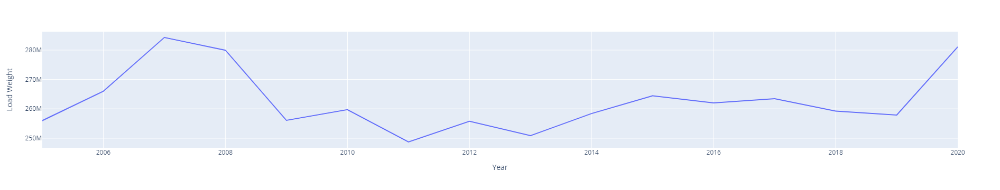

In [26]:
px.line(df_subset_load_type_year.loc[['GARBAGE COLLECTIONS']].reset_index(), x='Year', y='Load Weight')

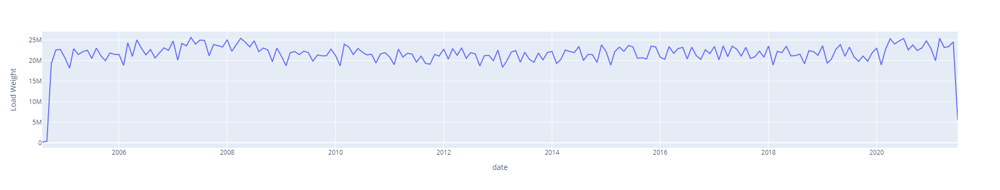

In [27]:
px.line(df_subset_load_type_date.loc[['GARBAGE COLLECTIONS']].reset_index(), x='date', y='Load Weight')

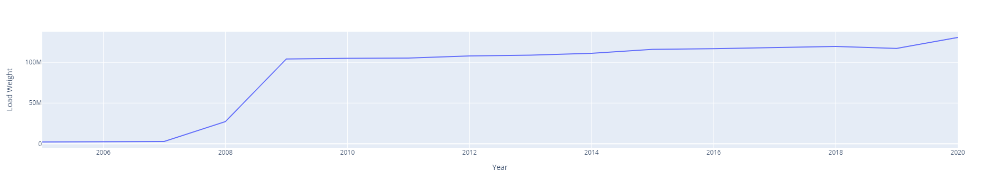

In [28]:
px.line(df_subset_load_type_year.loc[['RECYCLING - SINGLE STREAM']].reset_index(), x='Year', y='Load Weight')

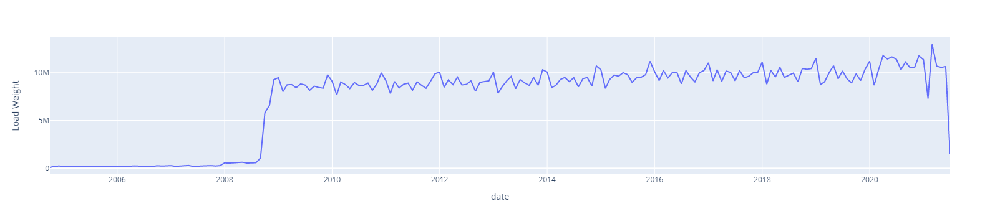

In [29]:
px.line(df_subset_load_type_date.loc[['RECYCLING - SINGLE STREAM']].reset_index(), x='date', y='Load Weight')

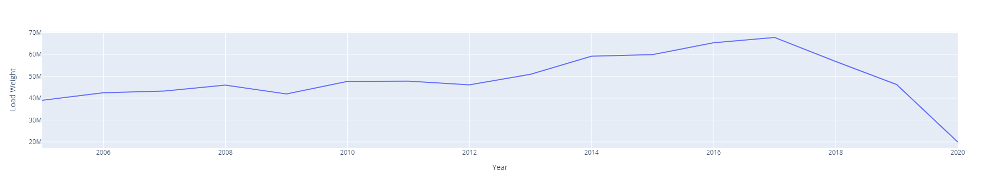

In [30]:
px.line(df_subset_load_type_year.loc[['YARD TRIMMING']].reset_index(), x='Year', y='Load Weight')

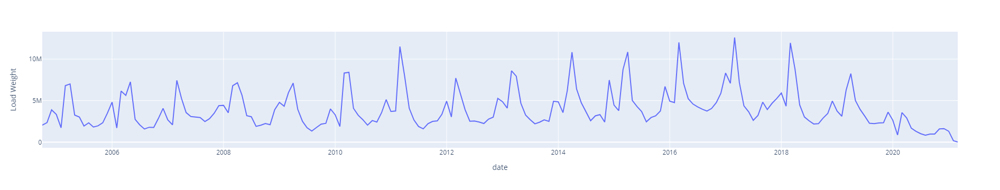

In [31]:
px.line(df_subset_load_type_date.loc[['YARD TRIMMING']].reset_index(), x='date', y='Load Weight')

Some preliminary observations:

1. The total load weight for GARBAGE COLLECTIONS dips after 2008. RECYCLING - SINGLE STREAM surges at the same time. Based on the monthly chart, RECYCLING - SINGLE STREAM surged from Oct 2008 - Dec 2008, while GARBAGE COLLECTIONS was in the midst of a sharp fall around that same period of time. <b>Fun Fact:</b> After looking up events that could have contributed to this pattern, it appears that Austin unveiled its Zero Waste Strategic Plan at the end of 2008 leading into 2009.

2. YARD TRIMMING volumes steadily rose from 2012 - 2017, then declined from 2018 - 2019, before plunging in 2020.

3. YARD TRIMMING shows strong seasonality, with regular peaks either in March or April of each year.

Let's do the same exercise for the other minor categories that have complete year/month data:

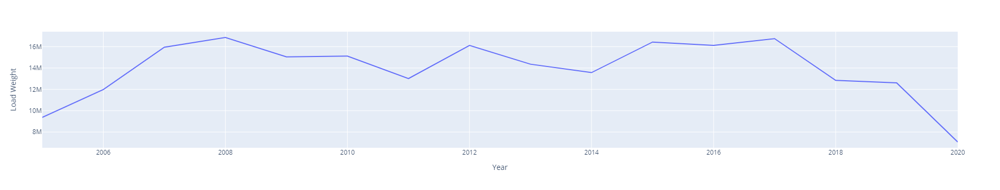

In [32]:
px.line(df_subset_load_type_year.loc[['BRUSH']].reset_index(), x='Year', y='Load Weight')

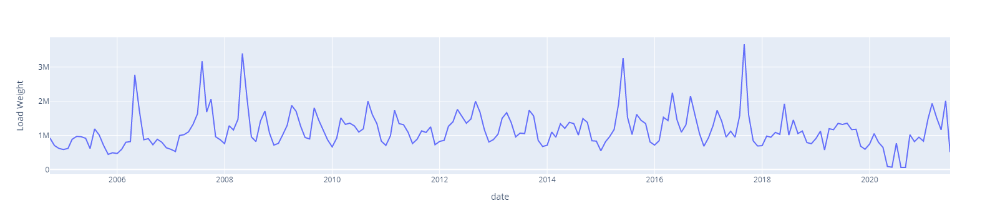

In [33]:
px.line(df_subset_load_type_date.loc[['BRUSH']].reset_index(), x='date', y='Load Weight')

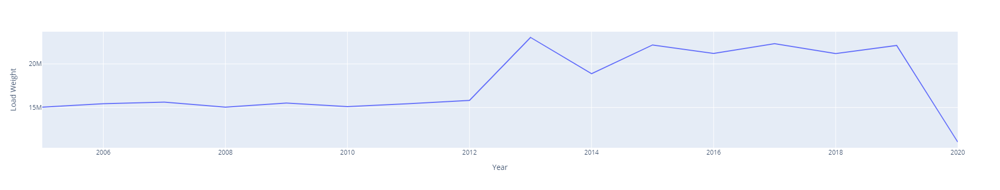

In [34]:
px.line(df_subset_load_type_year.loc[['BULK']].reset_index(), x='Year', y='Load Weight')

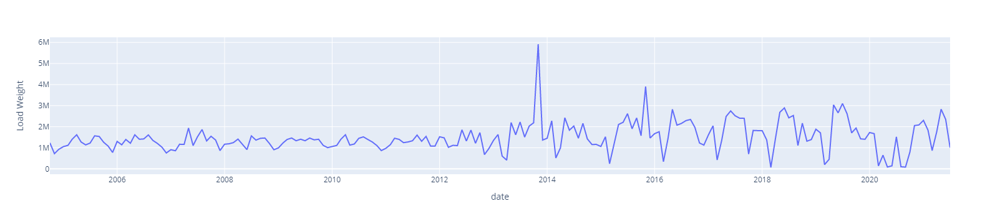

In [35]:
px.line(df_subset_load_type_date.loc[['BULK']].reset_index(), x='date', y='Load Weight')

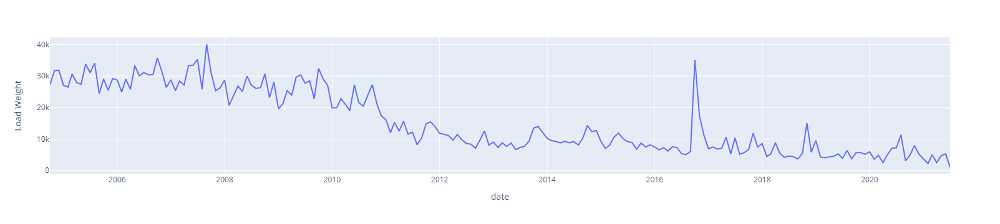

In [36]:
px.line(df_subset_load_type_date.loc[['DEAD ANIMAL']].reset_index(), x='date', y='Load Weight')

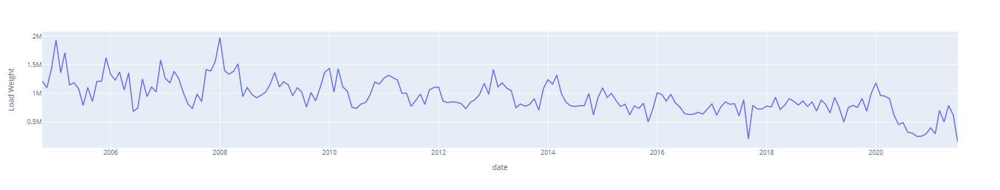

In [37]:
px.line(df_subset_load_type_date.loc[['SWEEPING']].reset_index(), x='date', y='Load Weight')

##### Next, let's explore the types of loads observed at the various dropoff sites

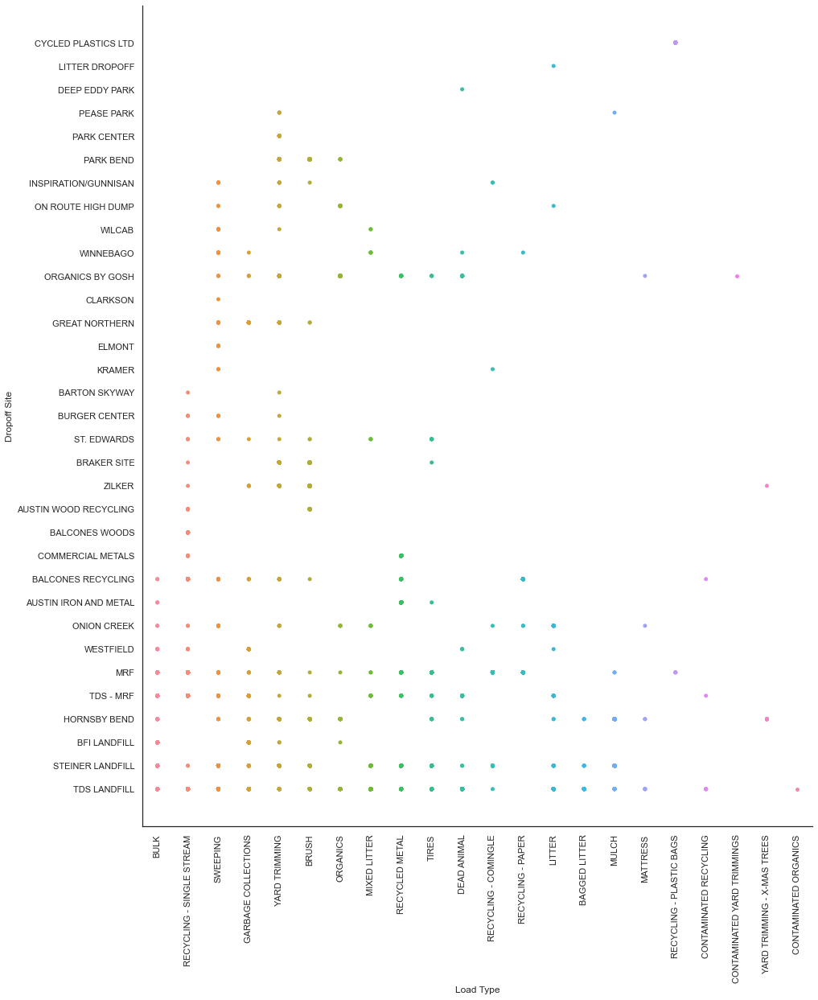

In [38]:
g = sns.catplot(x='Load Type', y='Dropoff Site', jitter=False, data=df, height=15);
g.set_xticklabels(rotation=90);

#### Population Data

In [42]:
# Population numbers from census: 2004-2016
population = [692102, 700407, 718912, 735088, 750525, 774037, 790390, 812025, 832326, 855215, 878733, 900701, 926426];

df2 = df[df['Year'].between(2003,2016)];
lw_median = df2.groupby(['Year'])['Load Weight'].median();
recycle_single_stream = [];

for yr in df2.groupby(['Year']):
    tmp_rec = yr[1][yr[1]['Load Type'] == 'RECYCLING - SINGLE STREAM']['Load Weight'].median();
    recycle_single_stream.append(tmp_rec);
    
load_population_check = pd.DataFrame({'Population':population, 'Load Weight':lw_median, 'Recycle':recycle_single_stream})

##### Let's check for any relationships between population numbers and load weights

In [44]:
from scipy.stats import pearsonr

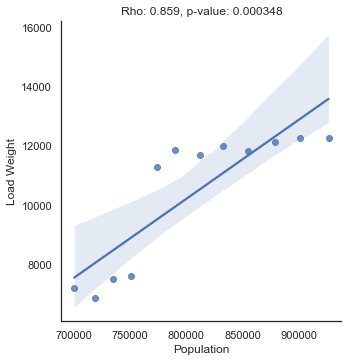

In [51]:
# regression statistics for population and load weight 
rho, pval = pearsonr(load_population_check['Population'].iloc[1:,], load_population_check['Load Weight'].iloc[1:,]);

# plot regression fit for population and load weight
sns.lmplot(x='Population', y='Load Weight', data=load_population_check.iloc[1:,]);
plt.title('Rho: {:.3f}, p-value: {:3f}'.format(rho, pval));

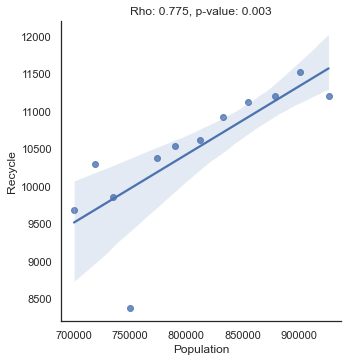

In [46]:
# regression statistics for population and recycling 
rho2, pval2 = pearsonr(load_population_check['Population'].iloc[1:,], load_population_check['Recycle'].iloc[1:,]);

# plot regression fit for population and recycling
sns.lmplot(x='Population', y='Recycle', data=load_population_check.iloc[1:,]);
plt.title('Rho: {:.3f}, p-value: {:.3f}'.format(rho2, pval2));

##### We see that load weights increase as the number of people increases as we would expect, but so does the propensity to recycle which may suggest that ongoing plans for Zero Waste are working.

## Weather Data

In [52]:
df_weather = pd.read_csv('data/austin_weather.csv')
df_weather.head()

,Date,TempHighF,TempAvgF,TempLowF,DewPointHighF,DewPointAvgF,DewPointLowF,HumidityHighPercent,HumidityAvgPercent,HumidityLowPercent,...,SeaLevelPressureAvgInches,SeaLevelPressureLowInches,VisibilityHighMiles,VisibilityAvgMiles,VisibilityLowMiles,WindHighMPH,WindAvgMPH,WindGustMPH,PrecipitationSumInches,Events
0,2013-12-21,74,60,45,67,49,43,93,75,57,...,29.68,29.59,10,7,2,20,4,31,0.46,"Rain , Thunderstorm"
1,2013-12-22,56,48,39,43,36,28,93,68,43,...,30.13,29.87,10,10,5,16,6,25,0,
2,2013-12-23,58,45,32,31,27,23,76,52,27,...,30.49,30.41,10,10,10,8,3,12,0,
3,2013-12-24,61,46,31,36,28,21,89,56,22,...,30.45,30.3,10,10,7,12,4,20,0,
4,2013-12-25,58,50,41,44,40,36,86,71,56,...,30.33,30.27,10,10,7,10,2,16,T,


In [53]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1319 entries, 0 to 1318
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Date                        1319 non-null   object
 1   TempHighF                   1319 non-null   int64 
 2   TempAvgF                    1319 non-null   int64 
 3   TempLowF                    1319 non-null   int64 
 4   DewPointHighF               1319 non-null   object
 5   DewPointAvgF                1319 non-null   object
 6   DewPointLowF                1319 non-null   object
 7   HumidityHighPercent         1319 non-null   object
 8   HumidityAvgPercent          1319 non-null   object
 9   HumidityLowPercent          1319 non-null   object
 10  SeaLevelPressureHighInches  1319 non-null   object
 11  SeaLevelPressureAvgInches   1319 non-null   object
 12  SeaLevelPressureLowInches   1319 non-null   object
 13  VisibilityHighMiles         1319 non-null   obje

In [54]:
df_weather['Date'] = pd.to_datetime(df_weather['Date'], infer_datetime_format=True)
df_weather['Year'] = pd.DatetimeIndex(df_weather['Date']).year
df_weather['Month'] = pd.DatetimeIndex(df_weather['Date']).month
df_weather['Day'] = pd.DatetimeIndex(df_weather['Date']).day

In [55]:
df_weather.head()

,Date,TempHighF,TempAvgF,TempLowF,DewPointHighF,DewPointAvgF,DewPointLowF,HumidityHighPercent,HumidityAvgPercent,HumidityLowPercent,...,VisibilityAvgMiles,VisibilityLowMiles,WindHighMPH,WindAvgMPH,WindGustMPH,PrecipitationSumInches,Events,Year,Month,Day
0,2013-12-21,74,60,45,67,49,43,93,75,57,...,7,2,20,4,31,0.46,"Rain , Thunderstorm",2013,12,21
1,2013-12-22,56,48,39,43,36,28,93,68,43,...,10,5,16,6,25,0,,2013,12,22
2,2013-12-23,58,45,32,31,27,23,76,52,27,...,10,10,8,3,12,0,,2013,12,23
3,2013-12-24,61,46,31,36,28,21,89,56,22,...,10,7,12,4,20,0,,2013,12,24
4,2013-12-25,58,50,41,44,40,36,86,71,56,...,10,7,10,2,16,T,,2013,12,25


In [56]:
df_comb = pd.merge(df2,df_weather)

In [60]:
date_lw = df_comb.groupby(['Date'])['Load Weight'].median();
date_avgF = df_comb.groupby(['Date'])['TempAvgF'].median();
df_combW = pd.DataFrame({'Load Weight':date_lw, 'TempAvgF':date_avgF});
df_typeW = df_comb.groupby(['Load Type']);

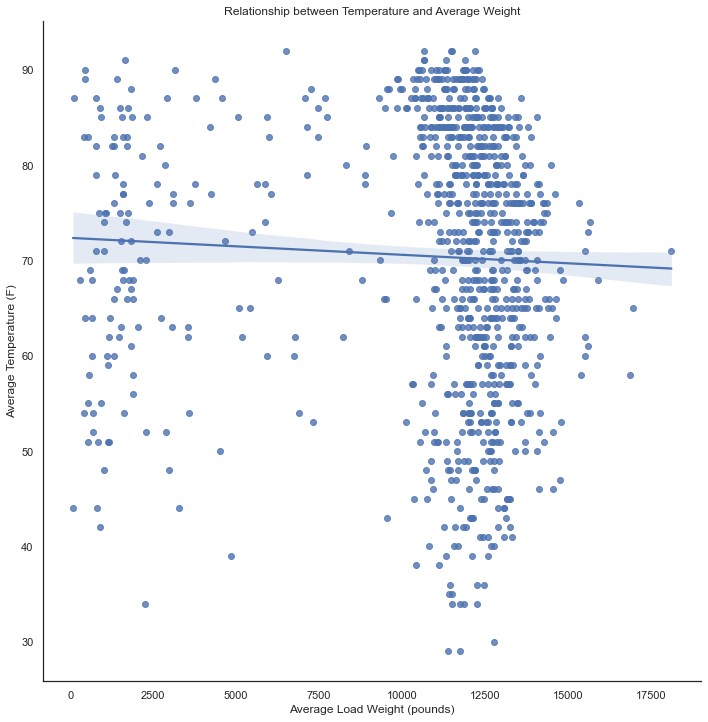

In [61]:
sns.lmplot(data=df_combW,x='Load Weight',y='TempAvgF', height=10);
plt.xlabel('Average Load Weight (pounds)');
plt.ylabel('Average Temperature (F)');
plt.title('Relationship between Temperature and Average Weight');
plt.show()

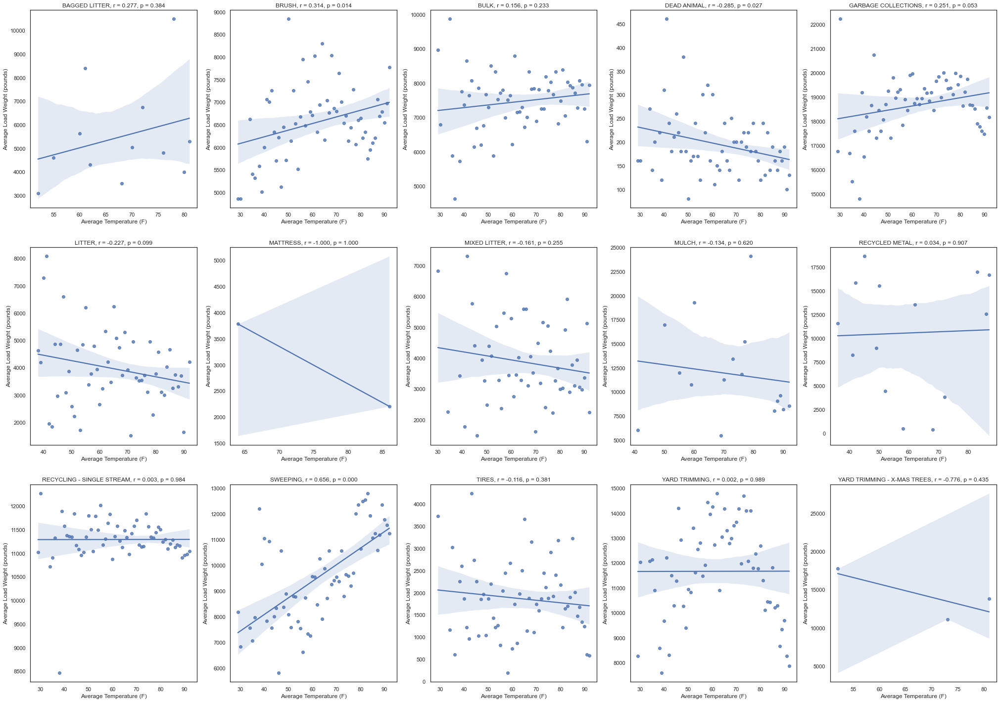

In [63]:
ax_x = 3;
ax_y = 5;

fig, axes = plt.subplots(ax_x, ax_y, figsize=(35, 25));

x = 0; y = 0;
for type in df_typeW:  
    type_lw = []; type_avgF = []; df_tmpT = []; rho3 = []; pval3 = [];
    type_lw = type[1].groupby(['TempAvgF'])['Load Weight'].median().reset_index();
    rho3, pval3 = pearsonr(type_lw['Load Weight'], type_lw['TempAvgF']);
        
    sns.regplot(ax=axes[x,y], data=type_lw, x='TempAvgF',y='Load Weight').set(title=type[0] + ', r = {:.3f}, p = {:.3f}'.format(rho3, pval3), ylabel='Average Load Weight (pounds)', xlabel='Average Temperature (F)');

    
    if y < ax_y-1:
        y += 1
    else:
        x += 1
        y = 0        
        


##### The patterns observed with temperature and load types suggest that temperature has an effect on load types like SWEEPING, DEAD ANIMALS etc. which reinforces some of the seasonality patterns mentioned earlier.

## Pollutants

In [65]:
df_pollutants = pd.read_csv('data/Pollutant_Reports.csv')

In [66]:
df_pollutants.head()

,OBJECTID,Percent_Spill_Recovered,Pollutant_Description,Pollutant_Type,Report_Description,Response_Date_Format,Service_Address,Spill_Volume_GALS_Conv,Spills_Volume_CY,Watershed,Work_Order_Number,X_Coord_SPCS,Y_Coord_SPCS,point,DATE_CREATED,RESPONSE_DATE
0,1313498,%,Sewage N.O.S,Sewage,Sewage overflow call from AWU.,03/02/2007,2200 GRISWOLD LN,30.0,NaN,JOHNSON,SCRP-WO-30285,3.107275e+06,1.007904e+07,POINT (-97.76448284 30.29129947),20220304,20070302
1,1312447,%,Wastewater N.O.S.,Contaminated Water,Investigation Workorder,02/18/1999,300 S 3RD ST,NaN,NaN,LADY BIRD LAKE,SCRP-WO-10656,3.150297e+06,1.013379e+07,POINT (-97.6239868501 30.4389973199),20220304,19990218
2,1312588,%,Unknown,Trash/Debris,Investigation Workorder,02/20/1990,400 DEEP EDDY AVE,NaN,NaN,LAKE AUSTIN,SCRP-WO-876,3.104613e+06,1.007399e+07,POINT (-97.77328528 30.2775914501),20220304,19900220
3,1311520,%,Unknown,Trash/Debris,Investigation Workorder,02/07/1994,5002 LYNNWOOD ST,NaN,NaN,SHOAL,SCRP-WO-3795,3.114483e+06,1.009036e+07,POINT (-97.74081569 30.32193761),20220304,19940207
4,1311042,%,Sewage N.O.S,Sewage,Investigation Workorder,02/01/2003,4512 ISLAND CV,NaN,NaN,LAKE AUSTIN,SCRP-WO-16639,3.102346e+06,1.009333e+07,POINT (-97.7790584701 30.3308737299),20220304,20030201


In [67]:
df_pollutants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29621 entries, 0 to 29620
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   OBJECTID                 29621 non-null  int64  
 1   Percent_Spill_Recovered  29621 non-null  object 
 2   Pollutant_Description    29620 non-null  object 
 3   Pollutant_Type           29621 non-null  object 
 4   Report_Description       29621 non-null  object 
 5   Response_Date_Format     29621 non-null  object 
 6   Service_Address          29539 non-null  object 
 7   Spill_Volume_GALS_Conv   13194 non-null  float64
 8   Spills_Volume_CY         1877 non-null   float64
 9   Watershed                28605 non-null  object 
 10  Work_Order_Number        29621 non-null  object 
 11  X_Coord_SPCS             29621 non-null  float64
 12  Y_Coord_SPCS             29621 non-null  float64
 13  point                    29621 non-null  object 
 14  DATE_CREATED          

In [68]:
df_pollutants.drop(df_pollutants[df_pollutants['Response_Date_Format'] == '//'].index, inplace=True)

In [69]:
df_pollutants.head()

,OBJECTID,Percent_Spill_Recovered,Pollutant_Description,Pollutant_Type,Report_Description,Response_Date_Format,Service_Address,Spill_Volume_GALS_Conv,Spills_Volume_CY,Watershed,Work_Order_Number,X_Coord_SPCS,Y_Coord_SPCS,point,DATE_CREATED,RESPONSE_DATE
0,1313498,%,Sewage N.O.S,Sewage,Sewage overflow call from AWU.,03/02/2007,2200 GRISWOLD LN,30.0,NaN,JOHNSON,SCRP-WO-30285,3.107275e+06,1.007904e+07,POINT (-97.76448284 30.29129947),20220304,20070302
1,1312447,%,Wastewater N.O.S.,Contaminated Water,Investigation Workorder,02/18/1999,300 S 3RD ST,NaN,NaN,LADY BIRD LAKE,SCRP-WO-10656,3.150297e+06,1.013379e+07,POINT (-97.6239868501 30.4389973199),20220304,19990218
2,1312588,%,Unknown,Trash/Debris,Investigation Workorder,02/20/1990,400 DEEP EDDY AVE,NaN,NaN,LAKE AUSTIN,SCRP-WO-876,3.104613e+06,1.007399e+07,POINT (-97.77328528 30.2775914501),20220304,19900220
3,1311520,%,Unknown,Trash/Debris,Investigation Workorder,02/07/1994,5002 LYNNWOOD ST,NaN,NaN,SHOAL,SCRP-WO-3795,3.114483e+06,1.009036e+07,POINT (-97.74081569 30.32193761),20220304,19940207
4,1311042,%,Sewage N.O.S,Sewage,Investigation Workorder,02/01/2003,4512 ISLAND CV,NaN,NaN,LAKE AUSTIN,SCRP-WO-16639,3.102346e+06,1.009333e+07,POINT (-97.7790584701 30.3308737299),20220304,20030201


In [70]:
df_pollutants['RESP_DATE'] = pd.to_datetime(df_pollutants['Response_Date_Format'], format='%m/%d/%Y') # infer_datetime_format=True)
df_pollutants['Year'] = pd.DatetimeIndex(df_pollutants['RESP_DATE']).year
df_pollutants['Month'] = pd.DatetimeIndex(df_pollutants['RESP_DATE']).month
df_pollutants['Day'] = pd.DatetimeIndex(df_pollutants['RESP_DATE']).day

In [71]:
df_WP = df_pollutants[df_pollutants['Year'].between(2004,2021)];

In [76]:
from shapely import wkt
import geopandas as gpd

In [77]:
df_WP['point converted'] = df_WP['point'].apply(wkt.loads);
gdf = gpd.GeoDataFrame(df_WP, geometry='point converted');
df_WP['longitude'] = gdf.geometry.x;
df_WP['latitude'] = gdf.geometry.y;

C:\Users\benjh\anaconda3\envs\DBS-MCI\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\benjh\anaconda3\envs\DBS-MCI\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\benjh\anaconda3\envs\DBS-MCI\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [78]:
BBox = ((df_WP.longitude.min(), df_WP.longitude.max(), df_WP.latitude.min(), df_WP.latitude.max()));
austin_map = plt.imread('data/austin_map.png');

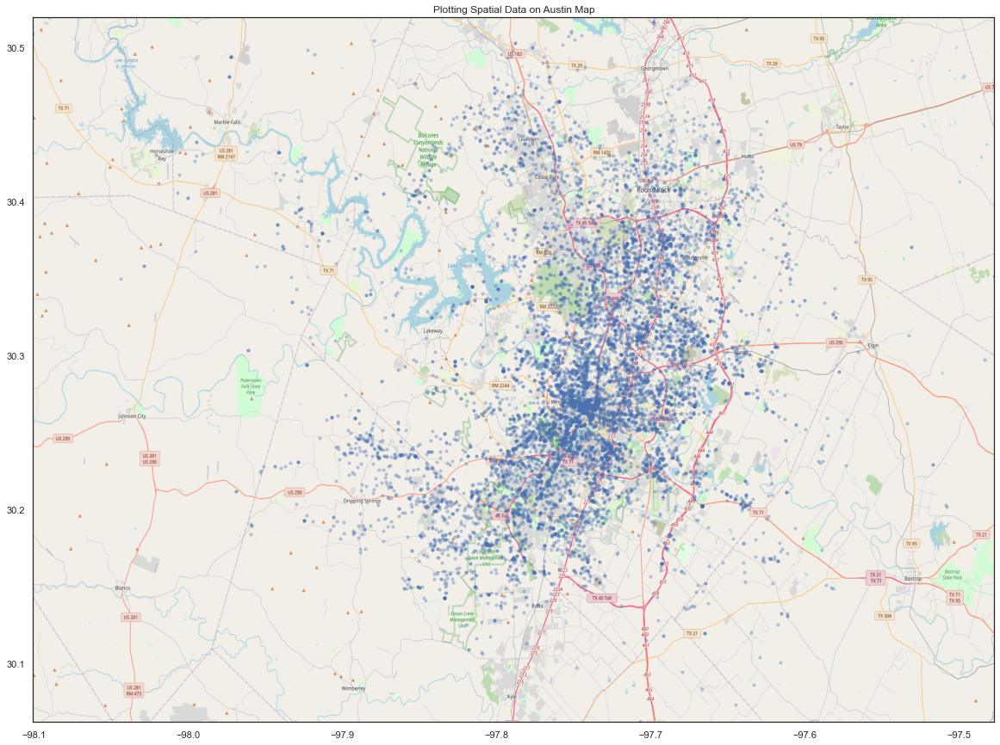

In [79]:
fig, ax = plt.subplots(figsize = (20,20));
ax.scatter(df_WP['longitude'], df_WP['latitude'], zorder=1, alpha= 0.3, c='b', s=10);
ax.set_title('Plotting Spatial Data on Austin Map');
ax.set_xlim(BBox[0],BBox[1]);
ax.set_ylim(BBox[2],BBox[3]);
ax.imshow(austin_map, zorder=0, extent = BBox, aspect= 'equal');

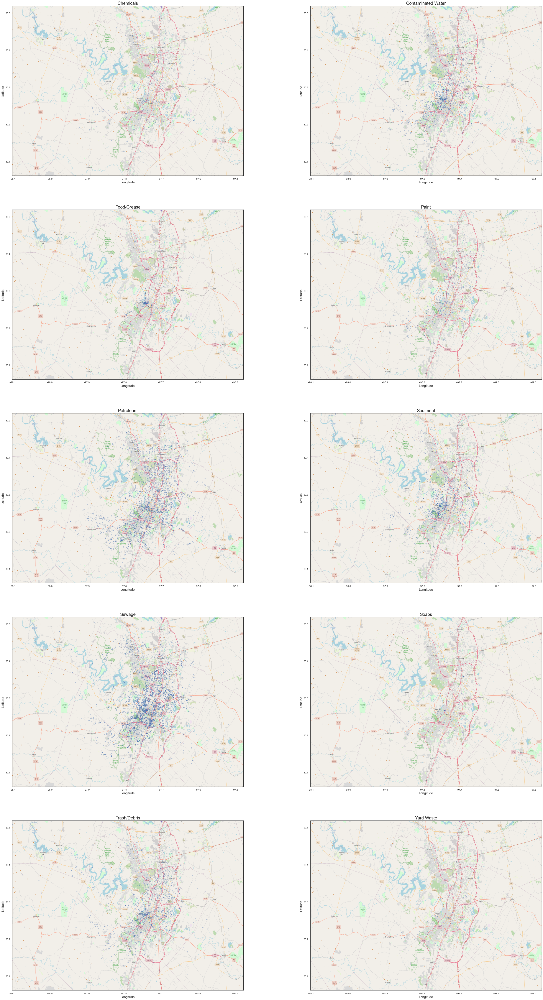

In [88]:
ax_x = 5; # 5
ax_y = 2; # 2

fig, ax = plt.subplots(ax_x, ax_y, figsize=(40, 60)); # 40 60

x = 0; y = 0;
for pollutant in df_WP.groupby(['Pollutant_Type']):  
    
    ax[x,y].scatter(pollutant[1]['longitude'], pollutant[1]['latitude'], zorder=1, alpha= 0.3, c='b', s=10);
    ax[x,y].set_title(pollutant[0], fontsize=20);
    ax[x,y].set_xlim(BBox[0],BBox[1]);
    ax[x,y].set_ylim(BBox[2],BBox[3]);
    ax[x,y].set_xlabel('Longitude', fontsize=15);
    ax[x,y].set_ylabel('Latitude', fontsize=15);
    ax[x,y].imshow(austin_map, zorder=0, extent = BBox, aspect= 'equal');

    
    if y < ax_y-1:
        y += 1
    else:
        x += 1
        y = 0        
        
plt.subplots_adjust(bottom=0.05, right=1, top=1.1);

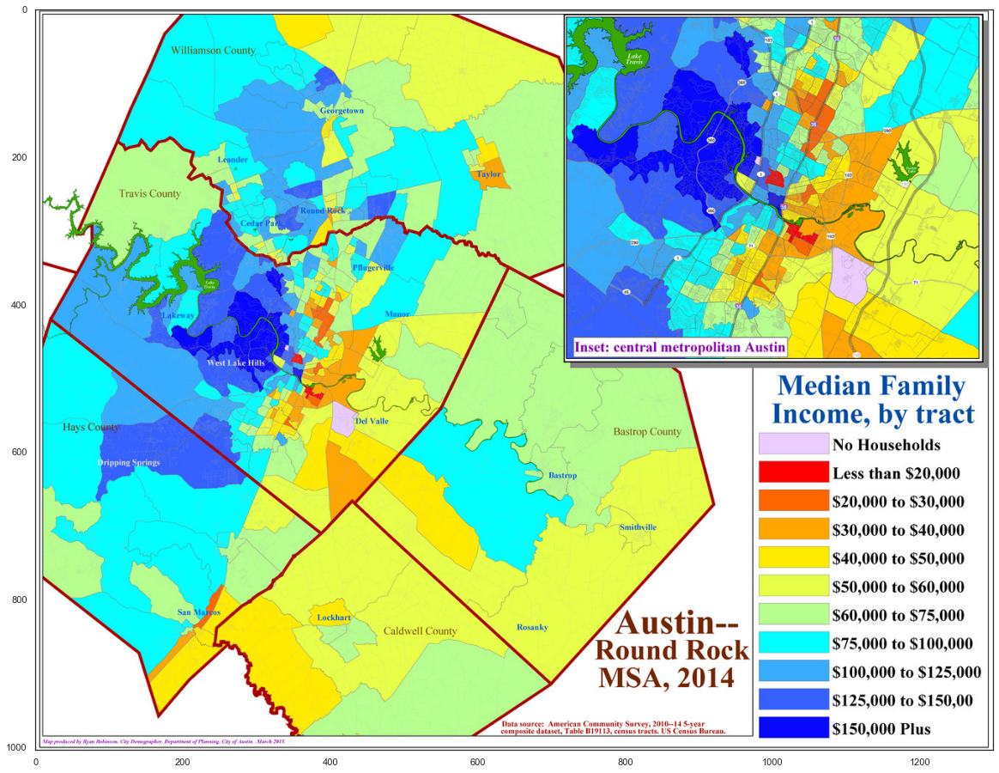

In [89]:
inc_map = plt.imread('data/inc.jpg');
plt.figure(figsize=(20,20));
plt.imshow(inc_map);

##### It seems like pollutants such as Food/Grease and Contaminated Water, and Trash/Debris are concentrated a little more in areas where the median household income are on the lower end of the spectrum, but access to GIS files behind paywalls may give us more insight into exactly which zones are impacted the most.

#### Since we do not have access to GIS data, let us examine the general relationship between income and loads by regressing major trash categories with income

In [112]:
median_income_df = pd.read_csv('./data/median_hh_income.csv')

In [113]:
median_income_df.head()

,DATE,MEHOINUSTXA646N
0,1984-01-01,23024
1,1985-01-01,23743
2,1986-01-01,24162
3,1987-01-01,24721
4,1988-01-01,24963


In [114]:
median_income_df = median_income_df.rename({"MEHOINUSTXA646N":"median_income"}, axis='columns')

In [115]:
median_income_df.head()

,DATE,median_income
0,1984-01-01,23024
1,1985-01-01,23743
2,1986-01-01,24162
3,1987-01-01,24721
4,1988-01-01,24963


In [116]:
median_income_df['DATE'] = pd.to_datetime(median_income_df['DATE'])

In [117]:
median_income_df['Year'] = median_income_df['DATE'].apply(lambda x:x.year)

In [118]:
median_income_df = median_income_df.drop(columns=['DATE'])

In [119]:
median_income_df.head()

,median_income,Year
0,23024,1984
1,23743,1985
2,24162,1986
3,24721,1987
4,24963,1988


In [120]:
median_income_df = median_income_df[(2004<median_income_df['Year'])&(median_income_df['Year']<2021)]

In [121]:
df_with_income = df_subset.groupby(['Load Type','Year']).agg('sum')

In [122]:
df_with_income = df_with_income.reset_index()

In [123]:
df_with_income

,Load Type,Year,Load Weight,Month
0,BRUSH,2004,2242000.0,5110
1,BRUSH,2005,9377540.0,12199
2,BRUSH,2006,11983684.0,15110
3,BRUSH,2007,15945495.0,18647
4,BRUSH,2008,16861263.0,18773
...,...,...,...,...
121,YARD TRIMMING,2017,67692721.0,34844
122,YARD TRIMMING,2018,56729644.0,30426
123,YARD TRIMMING,2019,46200182.0,27332
124,YARD TRIMMING,2020,19982920.0,10412


In [124]:
df_with_income = df_with_income.merge(median_income_df, how='inner', on='Year')

In [125]:
df_with_income

,Load Type,Year,Load Weight,Month,median_income
0,BRUSH,2005,9377540.0,12199,41422
1,BULK,2005,15039178.0,14108,41422
2,DEAD ANIMAL,2005,346560.0,2085,41422
3,GARBAGE COLLECTIONS,2005,256002112.0,106235,41422
4,RECYCLING - SINGLE STREAM,2005,2194170.0,1536,41422
...,...,...,...,...,...
107,DEAD ANIMAL,2020,68840.0,2299,68093
108,GARBAGE COLLECTIONS,2020,281084874.0,113544,68093
109,RECYCLING - SINGLE STREAM,2020,130568900.0,87582,68093
110,SWEEPING,2020,6995740.0,3710,68093


In [126]:
df_with_income_garbage = df_with_income[df_with_income['Load Type']=='GARBAGE COLLECTIONS']

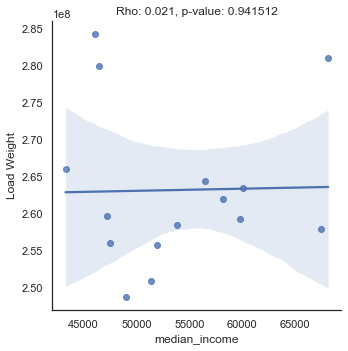

In [129]:
rho, pval = pearsonr(df_with_income_garbage['median_income'].iloc[1:,], df_with_income_garbage['Load Weight'].iloc[1:,]);

# plot regression fit for income and load weight
sns.lmplot(x='median_income', y='Load Weight', data=df_with_income_garbage.iloc[1:,]);
plt.title('Rho: {:.3f}, p-value: {:3f}'.format(rho, pval));

We observe that trash volumes do not vary with income.

In [130]:
df_with_income_recycling = df_with_income[df_with_income['Load Type']=='RECYCLING - SINGLE STREAM']

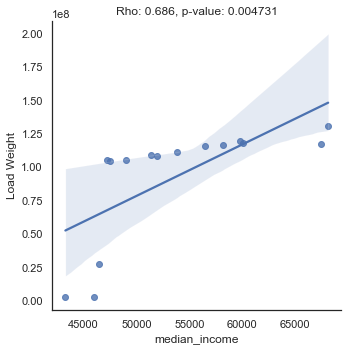

In [133]:
# regression statistics for recycling and load weight
rho, pval = pearsonr(df_with_income_recycling['median_income'].iloc[1:,], df_with_income_recycling['Load Weight'].iloc[1:,]);

# plot regression fit for recycling and load weight
sns.lmplot(x='median_income', y='Load Weight', data=df_with_income_recycling.iloc[1:,]);
plt.title('Rho: {:.3f}, p-value: {:3f}'.format(rho, pval));

We observe that recycling is positively correlated with income. This is interesting as previous studies has shown a negative correlation between income and recycling (for example, see "Household Knowledge, Attitudes and Practices in Solid Waste Segregation and Recycling: The Case of Urban Kampala" by Margaret Banga of Makerere University in May 2011). In essence, higher income households can afford to pay for waste collection services, and thus do not have to bother with separating waste into recyclable and non-recyclable waste beforehand.

Perhaps the positive correlation comes from the fact that higher income households spend more proportionately on waste that can be recycled e.g. plastic bottles from bottled mineral water. Moreover, as earlier observed, Texas's Zero Waste Strategic Plan from 2008-2009 could have encouraged such households to proactively segregate their waste into recyclable and non-recyclable waste.

In [134]:
df_with_income_recycling.sort_values('median_income')

,Load Type,Year,Load Weight,Month,median_income
4,RECYCLING - SINGLE STREAM,2005,2194170.0,1536,41422
11,RECYCLING - SINGLE STREAM,2006,2478980.0,1655,43307
18,RECYCLING - SINGLE STREAM,2007,2873260.0,1940,46053
25,RECYCLING - SINGLE STREAM,2008,27249320.0,32666,46490
39,RECYCLING - SINGLE STREAM,2010,104974840.0,73866,47266
32,RECYCLING - SINGLE STREAM,2009,104228300.0,73569,47475
46,RECYCLING - SINGLE STREAM,2011,105330598.0,71901,49047
60,RECYCLING - SINGLE STREAM,2013,108809956.0,68403,51406
53,RECYCLING - SINGLE STREAM,2012,107857601.0,69900,51926
67,RECYCLING - SINGLE STREAM,2014,111118770.0,69995,53875


Given the structural break that could have occurred with the introduction of the Zero Waste Strategic Plan in 2008, we examine the correlation between income and recycling post-2007:

In [137]:
df_with_income_recycling_2008_onwards = df_with_income_recycling[df_with_income_recycling['Year']>2007]

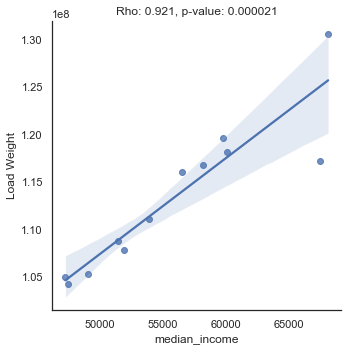

In [139]:
# regression statistics for income and load weight
rho, pval = pearsonr(df_with_income_recycling_2008_onwards['median_income'].iloc[1:,], \
                      df_with_income_recycling_2008_onwards['Load Weight'].iloc[1:,]);

# plot regression fit for income and load weight
sns.lmplot(x='median_income', y='Load Weight', data=df_with_income_recycling_2008_onwards.iloc[1:,]);
plt.title('Rho: {:.3f}, p-value: {:3f}'.format(rho, pval));

And what we see is that the relationship between income and recycling is even more positive than the previous analysis that included years before 2008.

In [25]:
df_with_income_yard = df_with_income[df_with_income['Load Type']=='YARD TRIMMING']

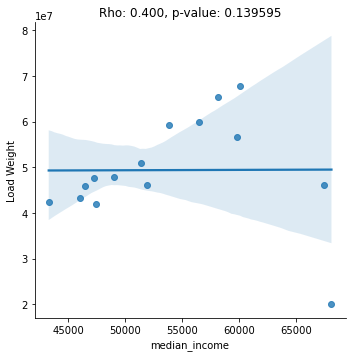

In [26]:
# regression statistics for income and load weight
rho, pval = spearmanr(df_with_income_yard['median_income'].iloc[1:,], df_with_income_yard['Load Weight'].iloc[1:,]);

# plot regression fit for income and load weight
sns.lmplot(x='median_income', y='Load Weight', data=df_with_income_yard.iloc[1:,]);
plt.title('Rho: {:.3f}, p-value: {:3f}'.format(rho, pval));

On face value, there seems to be no relationship between income and yard trimming. However, we notice that there is one datapoint that seems to be an outlier - high median income but extremely low load weight.

In [27]:
df_with_income_yard.sort_values('median_income', ascending=False)

,Load Type,year,Load Weight,month,median_income
219,YARD TRIMMING,2020,19982920.0,10412,68093
101,YARD TRIMMING,2019,46113242.0,27313,67444
189,YARD TRIMMING,2017,67692721.0,34880,60092
204,YARD TRIMMING,2018,56725624.0,30450,59785
85,YARD TRIMMING,2016,65272428.0,33085,58146
176,YARD TRIMMING,2015,59855374.0,31731,56473
71,YARD TRIMMING,2014,59158733.0,31264,53875
151,YARD TRIMMING,2012,46076180.0,23090,51926
163,YARD TRIMMING,2013,50858401.0,25506,51406
139,YARD TRIMMING,2011,47765868.0,22440,49047


And we notice that this outlier is in year 2020, the year where Covid impacted the US. So we remove 2020 from the analysis, and rerun the regression.

In [29]:
## This drops year 2020
df_with_income_yard_ex_covid = df_with_income_yard[df_with_income_yard['year'] < 2020]

In [30]:
df_with_income_yard_ex_covid

,Load Type,year,Load Weight,month,median_income
13,YARD TRIMMING,2005,39024026.0,21342,41422
28,YARD TRIMMING,2006,42462586.0,23788,43307
44,YARD TRIMMING,2008,45966832.0,23747,46490
57,YARD TRIMMING,2009,41905021.0,24452,47475
71,YARD TRIMMING,2014,59158733.0,31264,53875
85,YARD TRIMMING,2016,65272428.0,33085,58146
101,YARD TRIMMING,2019,46113242.0,27313,67444
115,YARD TRIMMING,2007,43215289.0,23068,46053
127,YARD TRIMMING,2010,47650109.0,23715,47266
139,YARD TRIMMING,2011,47765868.0,22440,49047


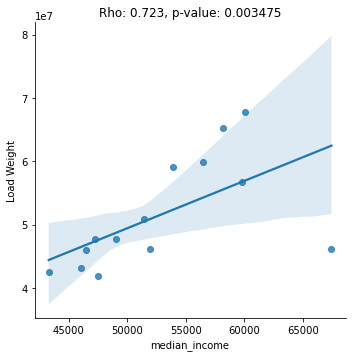

In [31]:
# regression statistics for income and load weight
rho, pval = spearmanr(df_with_income_yard_ex_covid['median_income'].iloc[1:,], \
                      df_with_income_yard_ex_covid['Load Weight'].iloc[1:,]);

# plot regression fit for income and load weight
sns.lmplot(x='median_income', y='Load Weight', data=df_with_income_yard_ex_covid.iloc[1:,]);
plt.title('Rho: {:.3f}, p-value: {:3f}'.format(rho, pval));

With the outlier removed, we observe a positive correlation between income and yard trimming waste. This is intuitively appealing: Higher income households live in larger homes, which have larger yards and therefore larger volumes of yard trimming waste.

In [63]:
df_with_income_yard.sort_values('median_income', ascending=False)

,Load Type,year,Load Weight,month,median_income
219,YARD TRIMMING,2020,19982920.0,10412,68093
101,YARD TRIMMING,2019,46113242.0,27313,67444
189,YARD TRIMMING,2017,67692721.0,34880,60092
204,YARD TRIMMING,2018,56725624.0,30450,59785
85,YARD TRIMMING,2016,65272428.0,33085,58146
176,YARD TRIMMING,2015,59855374.0,31731,56473
71,YARD TRIMMING,2014,59158733.0,31264,53875
151,YARD TRIMMING,2012,46076180.0,23090,51926
163,YARD TRIMMING,2013,50858401.0,25506,51406
139,YARD TRIMMING,2011,47765868.0,22440,49047


In [145]:
## This drops years 2019 and 2020
df_with_income_yard_less_65000 = df_with_income_yard[df_with_income_yard['median_income'] < 65000]

In [146]:
df_with_income_yard_less_65000

,Load Type,Year,Load Weight,Month,median_income
6,YARD TRIMMING,2005,39024026.0,21342,41422
13,YARD TRIMMING,2006,42462586.0,23790,43307
20,YARD TRIMMING,2007,43215289.0,23066,46053
27,YARD TRIMMING,2008,45966832.0,23746,46490
34,YARD TRIMMING,2009,41905021.0,24452,47475
41,YARD TRIMMING,2010,47650109.0,23714,47266
48,YARD TRIMMING,2011,47765868.0,22439,49047
55,YARD TRIMMING,2012,46076180.0,23083,51926
62,YARD TRIMMING,2013,50858401.0,25505,51406
69,YARD TRIMMING,2014,59158733.0,31256,53875


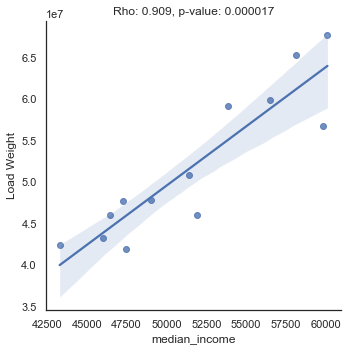

In [147]:
rho, pval = pearsonr(df_with_income_yard_less_65000['median_income'].iloc[1:,], \
                      df_with_income_yard_less_65000['Load Weight'].iloc[1:,]);

# plot regression fit for income and load weight
sns.lmplot(x='median_income', y='Load Weight', data=df_with_income_yard_less_65000.iloc[1:,]);
plt.title('Rho: {:.3f}, p-value: {:3f}'.format(rho, pval));

### Prediction with Prophet
### Data cleaning and preparation

In [7]:
tx_holidays_list = []
for date, event in texas_holidays.items():
    tx_holidays_list.append(date)

In [9]:
datafile = '../data/WasteCollection/waste-collection-diversion-report-daily_cleaned_full.csv'
df = pd.read_csv(datafile)

In [10]:
df.head()

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Load Time_parsed,year,month,day,hour,minute,second,day_of_week
0,12/08/2020,BULK,12/08/2020 03:02:00 PM,5220.0,TDS LANDFILL,BULK,BU13,899097,2020-12-08 15:02:00,2020,12,8,15,2,0,1
1,12/08/2020,RECYCLING - SINGLE STREAM,12/08/2020 10:00:00 AM,11140.0,TDS - MRF,RECYCLING - SINGLE STREAM,RTAU53,899078,2020-12-08 10:00:00,2020,12,8,10,0,0,1
2,12/03/2020,RECYCLING - SINGLE STREAM,12/03/2020 10:34:00 AM,10060.0,BALCONES RECYCLING,RECYCLING - SINGLE STREAM,RHBU10,899082,2020-12-03 10:34:00,2020,12,3,10,34,0,3
3,12/07/2020,SWEEPING,12/07/2020 10:15:00 AM,7100.0,TDS LANDFILL,SWEEPER DUMPSITES,DSS04,899030,2020-12-07 10:15:00,2020,12,7,10,15,0,0
4,12/07/2020,RECYCLING - SINGLE STREAM,12/07/2020 04:00:00 PM,12000.0,TDS - MRF,RECYCLING - SINGLE STREAM,RMAU53,899048,2020-12-07 16:00:00,2020,12,7,16,0,0,0


In [11]:
df['day_of_week'].describe()

count    740873.000000
mean          1.996025
std           1.473910
min           0.000000
25%           1.000000
50%           2.000000
75%           3.000000
max           6.000000
Name: day_of_week, dtype: float64

In [12]:
df_weekdays = df[df['day_of_week']<5]

In [13]:
df_weekdays['day_of_week'].describe()

count    722093.000000
mean          1.914449
std           1.401210
min           0.000000
25%           1.000000
50%           2.000000
75%           3.000000
max           4.000000
Name: day_of_week, dtype: float64

In [14]:
df_weekdays = df_weekdays.groupby(['year','month','day']).agg('sum')

In [15]:
df_weekdays

Load Weight    Load ID  hour  minute  second  day_of_week
year month day                                                           
2000 1     26        2940.0     163262    12      39       0            2
2001 3     16        8980.0    1044669    22      71       0            8
     10    16       22340.0    1091993    26      79       0            2
2004 1     6         8560.0     115049    11       0       0            1
     8     25      139140.0     883544   111     271       0           16
...                     ...        ...   ...     ...     ...          ...
2021 7     7      1583020.0  137447082  1880    3801       0          296
           8      1438990.0  116105695  1527    3667       0          375
           9       164920.0   27869087   317     626       0          120
     12    7         1340.0     927983     0       0       0            1
           21        6940.0     906125    12      41       0            1

[4369 rows x 6 columns]

In [16]:
df_weekdays = df_weekdays.reset_index()

In [17]:
df_weekdays.head(20)

,year,month,day,Load Weight,Load ID,hour,minute,second,day_of_week
0,2000,1,26,2940.0,163262,12,39,0,2
1,2001,3,16,8980.0,1044669,22,71,0,8
2,2001,10,16,22340.0,1091993,26,79,0,2
3,2004,1,6,8560.0,115049,11,0,0,1
4,2004,8,25,139140.0,883544,111,271,0,16
5,2004,8,26,61480.0,331310,44,54,0,9
6,2004,8,30,13160.0,286535,26,66,0,0
7,2004,9,28,120740.0,508205,61,189,0,5
8,2004,9,29,102600.0,508230,60,49,0,10
9,2004,9,30,134520.0,508255,60,150,0,15


In [18]:
## Remove irregular time intervals 2000/01/26 - 2004/08/30
df_weekdays = df_weekdays.iloc[7:]

In [19]:
df_weekdays.head()

,year,month,day,Load Weight,Load ID,hour,minute,second,day_of_week
7,2004,9,28,120740.0,508205,61,189,0,5
8,2004,9,29,102600.0,508230,60,49,0,10
9,2004,9,30,134520.0,508255,60,150,0,15
10,2004,10,1,842589.0,9561158,1143,2386,0,376
11,2004,10,4,1515463.0,17221482,1870,4347,0,0


In [20]:
df_weekdays.tail()

,year,month,day,Load Weight,Load ID,hour,minute,second,day_of_week
4364,2021,7,7,1583020.0,137447082,1880,3801,0,296
4365,2021,7,8,1438990.0,116105695,1527,3667,0,375
4366,2021,7,9,164920.0,27869087,317,626,0,120
4367,2021,12,7,1340.0,927983,0,0,0,1
4368,2021,12,21,6940.0,906125,12,41,0,1


In [21]:
df_weekdays = df_weekdays[~((df_weekdays['year']==2021)&(df_weekdays['month']==12))]

In [22]:
df_weekdays.tail()

,year,month,day,Load Weight,Load ID,hour,minute,second,day_of_week
4362,2021,7,5,1780570.0,129038479,1658,3498,0,0
4363,2021,7,6,1983860.0,155990009,2153,4165,0,168
4364,2021,7,7,1583020.0,137447082,1880,3801,0,296
4365,2021,7,8,1438990.0,116105695,1527,3667,0,375
4366,2021,7,9,164920.0,27869087,317,626,0,120


In [23]:
df_weekdays['ds']=pd.to_datetime(df_weekdays[['year', 'month', 'day']])

In [24]:
df_weekdays['ds'] = df_weekdays['ds'].map(lambda x:x.date())

In [25]:
df_weekdays.head()

,year,month,day,Load Weight,Load ID,hour,minute,second,day_of_week,ds
7,2004,9,28,120740.0,508205,61,189,0,5,2004-09-28
8,2004,9,29,102600.0,508230,60,49,0,10,2004-09-29
9,2004,9,30,134520.0,508255,60,150,0,15,2004-09-30
10,2004,10,1,842589.0,9561158,1143,2386,0,376,2004-10-01
11,2004,10,4,1515463.0,17221482,1870,4347,0,0,2004-10-04


In [26]:
df_weekdays = df_weekdays.reset_index(drop=True)

In [27]:
df_weekdays.head()

,year,month,day,Load Weight,Load ID,hour,minute,second,day_of_week,ds
0,2004,9,28,120740.0,508205,61,189,0,5,2004-09-28
1,2004,9,29,102600.0,508230,60,49,0,10,2004-09-29
2,2004,9,30,134520.0,508255,60,150,0,15,2004-09-30
3,2004,10,1,842589.0,9561158,1143,2386,0,376,2004-10-01
4,2004,10,4,1515463.0,17221482,1870,4347,0,0,2004-10-04


In [28]:
df_weekdays['ds'][0]

datetime.date(2004, 9, 28)

In [29]:
df_weekdays.iloc[80]

year                 2005
month                   1
day                    18
Load Weight     1494608.0
Load ID          22405714
hour                 2371
minute               5340
second                  0
day_of_week           195
ds             2005-01-18
Name: 80, dtype: object

In [30]:
## Remove holidays
for idx, date in df_weekdays['ds'].iteritems():
    if date in tx_holidays_list:
        df_weekdays = df_weekdays.drop(idx)

In [31]:
## Specify training (2004-2016) and testing (2017-2019) data; roughly 80-20 split

train_df = df_weekdays[df_weekdays['year']<=2016]
test_df = df_weekdays[(df_weekdays['year']>2016)&(df_weekdays['year']<2020)]

In [32]:
print(len(train_df))
print(len(test_df))

2978
728


In [37]:
train_df = train_df[['ds', 'Load Weight']].rename(columns={'Load Weight':'y'})
test_df = test_df[['ds', 'Load Weight']].rename(columns={'Load Weight':'y'})

### Fitting Model and Prediction (Prophet)

In [38]:
m = Prophet()

In [39]:
m.fit(train_df)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/opt/conda/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -116.246


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6940.03     0.0104826       270.591           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       6941.58   0.000104366       134.257   7.865e-07       0.001      233  LS failed, Hessian reset 
     196       6942.37   0.000183106       190.972   1.327e-06       0.001      348  LS failed, Hessian reset 
     199       6942.42   0.000446827       173.883           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       6942.82   6.77353e-05       61.7931   8.667e-07       0.001      442  LS failed, Hessian reset 
     259       6942.82   7.06011e-08       46.5686      0.1557      0.1557      467   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [40]:
## Use code below if you want to make a 1 year prediction period beyond current dataset
# future = m.make_future_dataframe(periods=365)
# future['ds'] = pd.to_datetime(future['ds'])
# future['day_of_week']=future['ds'].map(lambda x:x.day_of_week)
# future = future[future['day_of_week']<5]
# future.tail(10)

In [41]:
test_dates_only = test_df[['ds']]

In [42]:
forecast = m.predict(test_dates_only)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

/opt/conda/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/opt/conda/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


,ds,yhat,yhat_lower,yhat_upper
723,2019-12-20,1.867032e+06,1.635320e+06,2.116414e+06
724,2019-12-23,2.289647e+06,2.060175e+06,2.531287e+06
725,2019-12-27,1.933797e+06,1.693395e+06,2.179579e+06
726,2019-12-30,2.366667e+06,2.111967e+06,2.615520e+06
727,2019-12-31,2.128893e+06,1.877393e+06,2.363371e+06


In [43]:
forecast['ds'] = pd.to_datetime(forecast['ds'])

In [44]:
forecast['ds']

0     2017-01-03
1     2017-01-04
2     2017-01-05
3     2017-01-06
4     2017-01-09
         ...    
723   2019-12-20
724   2019-12-23
725   2019-12-27
726   2019-12-30
727   2019-12-31
Name: ds, Length: 728, dtype: datetime64[ns]

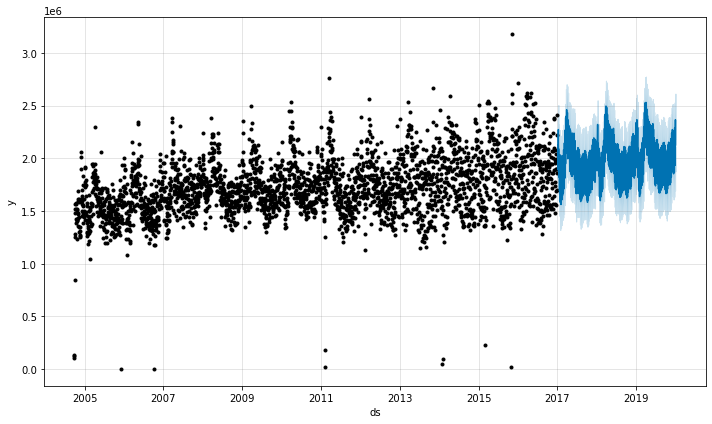

In [45]:
fig1 = m.plot(forecast)

In [46]:
test_df['ds'] = pd.to_datetime(test_df['ds'])

In [47]:
final_result = forecast.merge(test_df, on='ds')

In [48]:
final_result = final_result[['ds','y','yhat']]

In [49]:
final_result.head()

,ds,y,yhat
0,2017-01-03,2064280.0,2.037883e+06
1,2017-01-04,2721451.0,2.128901e+06
2,2017-01-05,2633161.0,2.040788e+06
3,2017-01-06,2096566.0,1.890286e+06
4,2017-01-09,2391920.0,2.273248e+06


In [50]:
## Error metrics

final_result['error'] = final_result['y']-final_result['yhat']
final_result['squared_error'] = final_result['error']**2
final_result['percentage_error'] = (final_result['error']/final_result['y'])*100

In [51]:
final_result.head()

,ds,y,yhat,error,squared_error,percentage_error
0,2017-01-03,2064280.0,2.037883e+06,26396.527273,6.967767e+08,1.278728
1,2017-01-04,2721451.0,2.128901e+06,592549.597286,3.511150e+11,21.773297
2,2017-01-05,2633161.0,2.040788e+06,592373.379863,3.509062e+11,22.496664
3,2017-01-06,2096566.0,1.890286e+06,206280.398882,4.255160e+10,9.838965
4,2017-01-09,2391920.0,2.273248e+06,118672.100809,1.408307e+10,4.961374


In [92]:
rmse = np.sqrt((final_result['squared_error'].sum())/len(final_result))
mape = np.sum(np.abs(final_result['percentage_error']))/len(final_result)
mae = np.sum(np.abs(final_result['error']))/len(final_result)

In [93]:
rmse

235593.4170223032

In [94]:
mape

10.824177590849501

In [95]:
mae

190930.71652710743

### Prediction with LightGBM

In [5]:
## Replace this with your files
datafile = '../data/WasteCollection/Waste_Collection___Diversion_Report__daily_.csv'

In [50]:
df = pd.read_csv(datafile, thousands=',')

In [51]:
df['Date'] = df['Report Date'].astype("datetime64")
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day_of_Week'] = df['Date'].dt.dayofweek 
df['Hour'] = pd.DatetimeIndex(df['Load Time']).hour

In [52]:
df.head()

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Date,Year,Month,Day_of_Week,Hour
0,12/08/2020,BULK,12/08/2020 03:02:00 PM,5220.0,TDS LANDFILL,BULK,BU13,899097,2020-12-08,2020,12,1,15
1,12/08/2020,RECYCLING - SINGLE STREAM,12/08/2020 10:00:00 AM,11140.0,TDS - MRF,RECYCLING - SINGLE STREAM,RTAU53,899078,2020-12-08,2020,12,1,10
2,12/03/2020,RECYCLING - SINGLE STREAM,12/03/2020 10:34:00 AM,10060.0,BALCONES RECYCLING,RECYCLING - SINGLE STREAM,RHBU10,899082,2020-12-03,2020,12,3,10
3,12/07/2020,SWEEPING,12/07/2020 10:15:00 AM,7100.0,TDS LANDFILL,SWEEPER DUMPSITES,DSS04,899030,2020-12-07,2020,12,0,10
4,12/07/2020,RECYCLING - SINGLE STREAM,12/07/2020 04:00:00 PM,12000.0,TDS - MRF,RECYCLING - SINGLE STREAM,RMAU53,899048,2020-12-07,2020,12,0,16


In [53]:
## Generate quick pandas profiling report
#profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)

## Generate in notebook
#profile.to_notebook_iframe()

## Generate in file
#profile.to_file("../data/reports/waste_collection.html")

In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 740873 entries, 0 to 740872
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Report Date   740873 non-null  object        
 1   Load Type     740873 non-null  object        
 2   Load Time     740873 non-null  object        
 3   Load Weight   668538 non-null  float64       
 4   Dropoff Site  740873 non-null  object        
 5   Route Type    740873 non-null  object        
 6   Route Number  740873 non-null  object        
 7   Load ID       740873 non-null  int64         
 8   Date          740873 non-null  datetime64[ns]
 9   Year          740873 non-null  int64         
 10  Month         740873 non-null  int64         
 11  Day_of_Week   740873 non-null  int64         
 12  Hour          740873 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(5), object(6)
memory usage: 73.5+ MB


In [55]:
## How much weekends do we have?
df_weekends = df.loc[df["Day_of_Week"] > 4]
print(len(df_weekends))

18605


In [56]:
print(f"This {(18605/740872)*100}% of the data belongs to weekends")

This 2.5112300100422207% of the data belongs to weekends


In [57]:
## How much weekends do we have?
df_year2003 = df.loc[df["Year"] == 2003]
print(len(df_year2003))

1


### Data cleaning and preparation

- Dropping outlier for Year = 2003
- Dropping NA rows for Load Weight
- Dropping off weekends
- Replace categories with values
- Dropping off holidays

In [58]:
df.drop(df.loc[df["Year"] == 2003].index, inplace=True)

In [59]:
df.dropna(inplace=True)

In [60]:
df_weekdays = df[df['Day_of_Week']<5]

In [61]:
## Replace values with categorical mapping for Load Type, Dropoff Site, Route Type, Route Number
labels_load_type = df_weekdays['Load Type'].astype('category').cat.categories.tolist()
labels_dropoff_site = df_weekdays['Dropoff Site'].astype('category').cat.categories.tolist()
labels_route_type = df_weekdays['Route Type'].astype('category').cat.categories.tolist()
labels_route_number = df_weekdays['Route Number'].astype('category').cat.categories.tolist()

In [62]:
replace_map_load_type = {'Load Type' : {k: v for k,v in zip(labels_load_type, list(range(1,len(labels_load_type)+1)))}}

print(replace_map_load_type)

{'Load Type': {'BAGGED LITTER': 1, 'BRUSH': 2, 'BULK': 3, 'CONTAMINATED ORGANICS': 4, 'CONTAMINATED RECYCLING': 5, 'CONTAMINATED YARD TRIMMINGS': 6, 'DEAD ANIMAL': 7, 'GARBAGE COLLECTIONS': 8, 'LITTER': 9, 'MATTRESS': 10, 'MIXED LITTER': 11, 'MULCH': 12, 'ORGANICS': 13, 'RECYCLED METAL': 14, 'RECYCLING - COMINGLE': 15, 'RECYCLING - PAPER': 16, 'RECYCLING - PLASTIC BAGS': 17, 'RECYCLING - SINGLE STREAM': 18, 'SWEEPING': 19, 'TIRES': 20, 'YARD TRIMMING': 21, 'YARD TRIMMING - X-MAS TREES': 22}}


In [63]:
replace_map_dropoff_site = {'Dropoff Site' : {k: v for k,v in zip(labels_dropoff_site, list(range(1,len(labels_dropoff_site)+1)))}}

print(replace_map_dropoff_site)

{'Dropoff Site': {'AUSTIN IRON AND METAL': 1, 'AUSTIN WOOD RECYCLING': 2, 'BALCONES RECYCLING': 3, 'BALCONES WOODS': 4, 'BARTON SKYWAY': 5, 'BFI LANDFILL': 6, 'BRAKER SITE': 7, 'BURGER CENTER': 8, 'CLARKSON': 9, 'COMMERCIAL METALS': 10, 'CYCLED PLASTICS LTD': 11, 'ELMONT': 12, 'GREAT NORTHERN': 13, 'HORNSBY BEND': 14, 'INSPIRATION/GUNNISAN': 15, 'KRAMER': 16, 'LITTER DROPOFF': 17, 'MRF': 18, 'ON ROUTE HIGH DUMP': 19, 'ONION CREEK': 20, 'ORGANICS BY GOSH': 21, 'PARK BEND': 22, 'PARK CENTER': 23, 'PEASE PARK': 24, 'ST. EDWARDS': 25, 'STEINER LANDFILL': 26, 'TDS - MRF': 27, 'TDS LANDFILL': 28, 'WESTFIELD': 29, 'WILCAB': 30, 'WINNEBAGO': 31, 'ZILKER': 32}}


In [64]:
replace_map_route_type = {'Route Type' : {k: v for k,v in zip(labels_route_type, list(range(1,len(labels_route_type)+1)))}}

print(replace_map_route_type)

{'Route Type': {'ALLEY BULK REMOVAL': 1, 'BRUSH': 2, 'BULK': 3, 'CAP BRUSH': 4, 'CAP BULK': 5, 'CAP STORM': 6, 'CAP STORM BR': 7, 'CAP STORM BU': 8, 'DEAD ANIMAL': 9, 'GARBAGE COLLECTION': 10, 'HAULING': 11, 'INHOUSE - RECYCLING': 12, 'KAB': 13, 'LITTER CONTROL': 14, 'LITTER P/U': 15, 'ON CALL BULK': 16, 'OUT OF CYCLE BRUSH': 17, 'OUT OF CYCLE BULK': 18, 'RECYCLING': 19, 'RECYCLING - PILOT': 20, 'RECYCLING - SINGLE STREAM': 21, 'RECYCLING DEAD END': 22, 'SPECIAL EVENTS': 23, 'SPECIAL PROJECT BR': 24, 'SPECIAL PROJECT BU': 25, 'SPECIAL PROJECT LC': 26, 'SPECIAL PROJECT YT': 27, 'STORM': 28, 'STORM SWEEPING': 29, 'STREET CLEANING-BIKE LANES': 30, 'STREET CLEANING-BLVD': 31, 'STREET CLEANING-DOWNTOWN': 32, 'STREET CLEANING-RESIDENTIAL': 33, 'STREET CLEANING-SPECIAL PROJECTS': 34, 'SWEEPER DUMPSITES': 35, 'YARD TRIMMINGS': 36, 'YARD TRIMMINGS-ORGANICS': 37, 'YARD TRIMMINGS-STORM CLEANUP': 38}}


In [65]:
replace_map_route_number = {'Route Number' : {k: v for k,v in zip(labels_route_number, list(range(1,len(labels_route_number)+1)))}}

print(len(replace_map_route_number["Route Number"]))

1494


Ignore route numbers.

In [66]:
df_category_replace = df_weekdays.copy()

In [67]:
df_category_replace.replace(replace_map_load_type, inplace=True)

In [68]:
df_category_replace.replace(replace_map_dropoff_site, inplace=True)

In [69]:
df_category_replace.replace(replace_map_route_type, inplace=True)

In [138]:
df_category_replace.head(30)

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Date,Year,Month,Day_of_Week,Hour
0,12/08/2020,3,12/08/2020 03:02:00 PM,5220.0,28,3,BU13,899097,2020-12-08,2020,12,1,15
1,12/08/2020,18,12/08/2020 10:00:00 AM,11140.0,27,21,RTAU53,899078,2020-12-08,2020,12,1,10
2,12/03/2020,18,12/03/2020 10:34:00 AM,10060.0,3,21,RHBU10,899082,2020-12-03,2020,12,3,10
3,12/07/2020,19,12/07/2020 10:15:00 AM,7100.0,28,35,DSS04,899030,2020-12-07,2020,12,0,10
4,12/07/2020,18,12/07/2020 04:00:00 PM,12000.0,27,21,RMAU53,899048,2020-12-07,2020,12,0,16
5,12/04/2020,8,12/04/2020 01:01:00 PM,22720.0,28,10,PAF03,899012,2020-12-04,2020,12,4,13
6,12/08/2020,3,12/08/2020 12:37:00 PM,7700.0,28,3,BU13,899094,2020-12-08,2020,12,1,12
7,12/08/2020,3,12/08/2020 03:56:00 PM,6520.0,28,3,BU13,899092,2020-12-08,2020,12,1,15
8,12/04/2020,8,12/04/2020 02:48:00 PM,26320.0,28,10,PAF01,899010,2020-12-04,2020,12,4,14
9,12/07/2020,18,12/07/2020 02:00:00 PM,11600.0,27,21,RMAU51,899043,2020-12-07,2020,12,0,14


In [162]:
## Drop "Route Number", "Load ID", "Report Date", "Load Time", "Year", "Month", "Day_of_Week", "Hour"
df_category_replace_clean = df_category_replace.drop(["Report Date", "Load Time", "Year", "Month", "Day_of_Week", "Hour"], axis=1)

In [163]:
## Drop 
df_category_replace_clean = df_category_replace_clean.drop(["Route Number", "Load ID"], axis=1)

In [164]:
df_category_replace_clean=df_category_replace_clean.sort_values(by=['Date'])

In [165]:
df_category_replace_clean.head(30)

,Load Type,Load Weight,Dropoff Site,Route Type,Date
638807,8,17780.0,28,10,2004-08-25
160612,8,8620.0,28,10,2004-08-25
64547,8,16780.0,28,10,2004-08-25
135160,8,4980.0,28,10,2004-08-25
354123,8,16640.0,28,10,2004-08-25
450384,8,21780.0,28,10,2004-08-25
455686,8,23940.0,28,10,2004-08-25
400983,8,28620.0,28,10,2004-08-25
26663,8,31920.0,28,10,2004-08-26
397059,8,8980.0,28,10,2004-08-26


In [351]:
tx_holidays_list[0]

datetime.date(2004, 1, 1)

In [325]:
## Grouping up by date, aggregate categories
df_category_replace_clean_date = df_category_replace_clean.drop(["Load Type", "Dropoff Site", "Route Type"], axis=1) 
df_category_replace_clean_date = df_category_replace_clean_date.groupby(['Date'], as_index=False).sum()

In [347]:
len(df_category_replace_clean_date)

4070

In [362]:
df_category_replace_clean_date.loc[~df_category_replace_clean_date['Date'].isin(tx_holidays_list)]

,Date,Load Weight
0,2004-08-25,139140.0
1,2004-08-26,61480.0
2,2004-08-30,13160.0
3,2004-09-28,120740.0
4,2004-09-29,102600.0
...,...,...
4327,2021-07-02,1626720.0
4329,2021-07-06,1921640.0
4330,2021-07-07,1553080.0
4331,2021-07-08,1417650.0


In [348]:
## Dropping off holidays in Texas
years_list = np.arange(2004,2022)

texas_holidays = holidays.US(subdiv='TX', years=years_list)
tx_holidays_list = []
for date, event in texas_holidays.items():
    tx_holidays_list.append(date)

In [327]:

    

## Remove holidays
for idx, date in df_category_replace_clean_date['Date'].iteritems():
    for holiday_date in tx_holidays_list:
        if date.date() == holiday_date:
            df_category_replace_clean_date = df_category_replace_clean_date.drop(idx)

In [246]:
df_category_replace_clean_date.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4070 entries, 0 to 4332
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         4070 non-null   datetime64[ns]
 1   Load Weight  4070 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 95.4 KB


In [247]:
df_category_replace_clean_date = df_category_replace_clean_date.set_index('Date').asfreq("d")
df_category_replace_clean_date = df_category_replace_clean_date.dropna()

In [248]:
df_category_replace_clean_date.head()

,Load Weight
Date,
2004-08-25,139140.0
2004-08-26,61480.0
2004-08-30,13160.0
2004-09-28,120740.0
2004-09-29,102600.0


### Creation of Training, Test Data and Model Fitting (LightGBM)

In [258]:
### CREATE X,Y ####
def create_xy(series, window_size, prediction_horizon, shuffle = False):
    x = []
    y = []
    for i in range(0, len(series)):
        if len(series[(i + window_size):(i + window_size + prediction_horizon)]) < prediction_horizon:
            break
        x.append(series[i:(i + window_size)])
        y.append(series[(i + window_size):(i + window_size + prediction_horizon)])
    x = np.array(x)
    y = np.array(y)
    return x,y

In [281]:
### HYPERPARAMETERS ###
window_size = 15
prediction_horizon = 1

### TRAIN VAL SPLIT ### (include shuffling later)
test_size = 90
split_time = len(df_category_replace_clean_date) - test_size

train_series = df_category_replace_clean_date[:split_time]
test_series = df_category_replace_clean_date[split_time - window_size:]

train_x, train_y = create_xy(train_series, window_size, prediction_horizon)
test_x, test_y = create_xy(test_series, window_size, prediction_horizon)

train_y = train_y.flatten()
test_y = test_y.flatten()

train_x = train_x.reshape(train_x.shape[0],-1)
test_x = test_x.reshape(90,-1)

print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)

(3965, 15)
(3965,)
(90, 15)
(90,)


In [271]:
test_series

,Load Weight
Date,
2021-01-29,1735170.0
2021-02-01,2439480.0
2021-02-02,2078860.0
2021-02-03,1991880.0
2021-02-04,2108580.0
...,...
2021-07-02,1626720.0
2021-07-06,1921640.0
2021-07-07,1553080.0


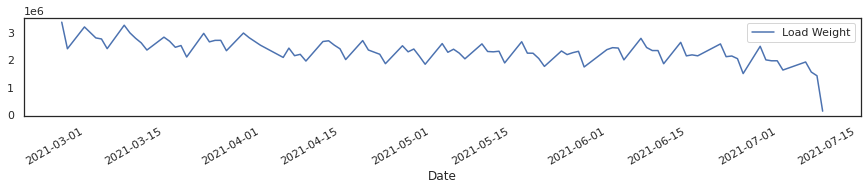

In [268]:
plot_x_size = 15
plot_y_size = 2
plt.rcParams['figure.figsize'] = [plot_x_size, plot_y_size]

df_category_replace_clean_date[-test_size:].plot(label = 'Load Weight')
plt.legend()
plt.show()

In [275]:
import lightgbm as lgb

params = {
    'n_estimators': 2000,
    'max_depth': 8,
    'num_leaves': 2**4,
    'learning_rate': 0.1,
    'boosting_type': 'dart'
}

model = lgb.LGBMRegressor(first_metric_only = True, **params)

model.fit(train_x, train_y,
          eval_metric = 'l1', 
          eval_set = [(test_x, test_y)],
          #early_stopping_rounds = 10,
          verbose = 0)

LGBMRegressor(boosting_type='dart', first_metric_only=True, max_depth=8,
              n_estimators=2000, num_leaves=16)

     Naive MAE: 460648.3566
  s7-Naive MAE: 405191.3074
 s30-Naive MAE: 377450.5126
s365-Naive MAE: 557799.3857
  LightGBM MAE: 285383.5276


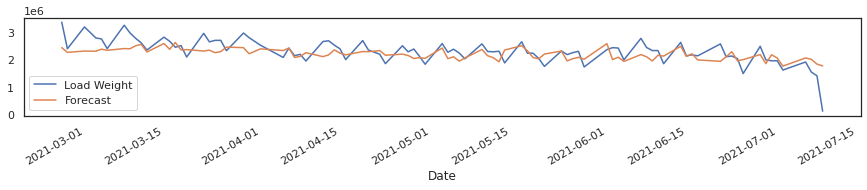

In [296]:
forecast = model.predict(test_x)
s1_naive = df_category_replace_clean_date[-29:-1].to_numpy()
s7_naive = df_category_replace_clean_date[-35:-7].to_numpy()
s30_naive = df_category_replace_clean_date[-56:-28].to_numpy()
s365_naive = df_category_replace_clean_date[-364:-336].to_numpy()

print('     Naive MAE: %.4f' % (np.mean(np.abs(s1_naive - test_y))))
print('  s7-Naive MAE: %.4f' % (np.mean(np.abs(s7_naive - test_y))))
print(' s30-Naive MAE: %.4f' % (np.mean(np.abs(s30_naive - test_y))))
print('s365-Naive MAE: %.4f' % (np.mean(np.abs(s365_naive - test_y))))
print('  LightGBM MAE: %.4f' % (np.mean(np.abs(forecast - test_y))))

plt.rcParams['figure.figsize'] = [plot_x_size, plot_y_size]
forecast_df = pd.DataFrame(forecast,index=df_category_replace_clean_date[-test_size:].index)
df_category_replace_clean_date[-test_size:].plot(label = 'True')
plt.plot(forecast_df, label = 'Forecast')
plt.legend()
plt.show()

  7 --- MAE: -140824.005 (7286.776)
 30 --- MAE: -140654.342 (5492.446)
180 --- MAE: -139789.946 (8251.609)
365 --- MAE: -142180.568 (7799.996)
545 --- MAE: -145161.227 (6823.373)
730 --- MAE: -145865.622 (6422.724)


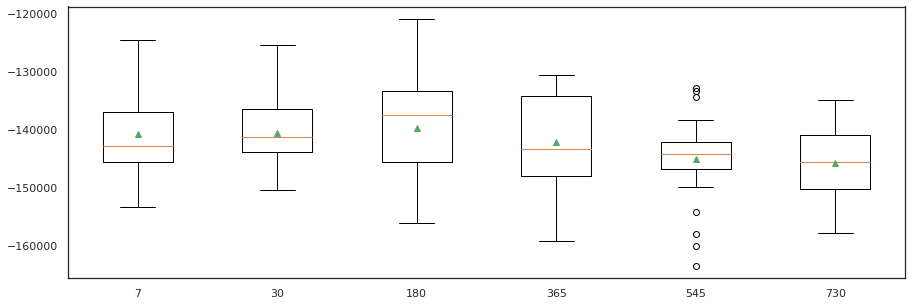

In [282]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

params = {
    'n_estimators': 2000,
    'max_depth': 4,
    'num_leaves': 2**4,
    'learning_rate': 0.1,
    'boosting_type': 'dart'
}

windows = [7, 30, 180, 365, 545, 730]

results = []
names = []
for w in windows:

    window_size = w

    train_x, train_y = create_xy(train_series, window_size, prediction_horizon)
    train_x = train_x.reshape(train_x.shape[0],-1)

    train_y = train_y.flatten()

    cv = RepeatedKFold(n_splits = 10, n_repeats = 3, random_state = 123)
    scores = cross_val_score(lgb.LGBMRegressor(**params), train_x, train_y, scoring = 'neg_mean_absolute_error', cv = cv, n_jobs = -1)
    results.append(scores)
    names.append(w)
    print('%3d --- MAE: %.3f (%.3f)' % (w, np.mean(scores), np.std(scores)))

plt.rcParams['figure.figsize'] = [plot_x_size, 5]    
    
plt.boxplot(results, labels = names, showmeans = True)
plt.show()